## 데이터 증강(Data Augmentation)
데이터가 적으면 모델이 훈련 데이터만 외움- > 과적합 발생 -> 새 데이터에 약함 <br>
**데이터 증강은?** 가지고 있는 데이터를 조금씩 변형해서 새로운 데이터처럼 쓰자 <br>
ex) Flip, Rotation, Zoom, Brightness, Contrast <br>

즉, 데이터 증강을 함으로써 테스트 성능 향상

In [1]:
!unzip "/content/Raccoon.v38-416x416-resize.yolov8 (2).zip" -d dataset

Archive:  /content/Raccoon.v38-416x416-resize.yolov8 (2).zip
   creating: dataset/Raccoon.v38-416x416-resize.yolov8/
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/data.yaml  
   creating: dataset/Raccoon.v38-416x416-resize.yolov8/images/
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-100_jpg.rf.e9338202a924dc489ffd94e0291a0f39.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-101_jpg.rf.a9e8a95f51d60d7d3b40d3243aa11afd.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-102_jpg.rf.d140a1fcbfc8d62c7ad37167714f79df.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-103_jpg.rf.7148e5c7d785760fe9cb6b7762180977.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-104_jpg.rf.e5f8de5f977a32d8a7f2223574ff2b72.jpg  
  inflating: dataset/Raccoon.v38-416x416-resize.yolov8/images/raccoon-105_jpg.rf.73bb0ca933f4a5d8e47ee57c46617cd7.jpg  
  inflating: dataset/Raccoon.v38-

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.5 MB/s eta 0:00:00


In [3]:
from pathlib import Path
import yaml, shutil, datetime
from tqdm import tqdm
from sklearn.model_selection import KFold

dataset_dir = Path("/content/dataset")
img_dir   = dataset_dir / "images"
label_dir = dataset_dir / "labels"
data_yaml = dataset_dir / "data.yaml"

In [19]:
k_splits = 5
seed = 20
batch = 16
epochs = 150
project = "kfold_demo"
weight = "yolov8s.pt"

In [5]:
# 1. names 로드
with open(data_yaml, encoding="utf-8") as y:
    names = yaml.safe_load(y)["names"]

In [6]:
# 2. 이미지/라벨 매칭
exts = {".jpg", ".jpeg", ".png"}
pairs = []  # (image_path, label_path)
for lf in sorted(label_dir.rglob("*.txt")):
    stem = lf.stem
    for ext in exts:
        cand = img_dir / f"{stem}{ext}"
        if cand.exists():
            pairs.append((cand, lf))
            break

In [7]:
# 3. K-Fold 분할
kf = KFold(n_splits=k_splits, shuffle=True, random_state=seed) # 데이터 5개로 나누고, 데이터 섞고(순서대로 분할하면 편향 생김), 매번 똑같이 섞도록 고정
splits = list(kf.split(pairs))

In [8]:
# 4. 폴더 생성
root_out = dataset_dir / f"{datetime.date.today().isoformat()}_{k_splits}-Fold_CV"
root_out.mkdir(parents=True, exist_ok=True)
ds_yamls = []

for i, (train_idx, val_idx) in enumerate(splits, start=1):
    split_dir = root_out / f"split_{i}"
    (split_dir / "train" / "images").mkdir(parents=True, exist_ok=True)
    (split_dir / "train" / "labels").mkdir(parents=True, exist_ok=True)
    (split_dir / "val" / "images").mkdir(parents=True, exist_ok=True)
    (split_dir / "val" / "labels").mkdir(parents=True, exist_ok=True)

In [ ]:
# 5. 파일 복사
for idx in train_idx:
    img_path, lbl_path = pairs[idx]
    shutil.copy(img_path, split_dir / "train/images" / img_path.name)
    shutil.copy(lbl_path, split_dir / "train/labels" / lbl_path.name)
for idx in val_idx:
    img_path, lbl_path = pairs[idx]
    shutil.copy(img_path, split_dir / "val/images" / img_path.name)
    shutil.copy(lbl_path, split_dir / "val/labels" / lbl_path.name)

In [ ]:
# 6. data.yaml 생성
dataset_yaml = split_dir / f"split_{i}_dataset.yaml"
with open(dataset_yaml, "w", encoding="utf-8") as ds_y:
    yaml.safe_dump(
        {
            "path": split_dir.as_posix(),
            "train": "train",
            "val": "val",
            "names": names,
        },
        ds_y,
        allow_unicode=True,
        sort_keys=False,
    )
ds_yamls.append(dataset_yaml)

In [20]:
# 7. 학습
from ultralytics import YOLO

for i, dataset_yaml in enumerate(ds_yamls, start=1):
    model = YOLO(weight)
    model.train(
        data=str(dataset_yaml),
        epochs=epochs,
        imgsz=640,
        patience=50,
        batch=batch,
        project=project,
        name=f"fold_{i}",
    )

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/2025-09-02_5-Fold_CV/split_1/split_1_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=fold_12, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=50, perspectiv

### 성능 확인

In [24]:
from ultralytics import YOLO

weights = [
    "/content/kfold_demo/fold_1/weights/best.pt",
    "/content/kfold_demo/fold_2/weights/best.pt",
    "/content/kfold_demo/fold_3/weights/best.pt",
    "/content/kfold_demo/fold_4/weights/best.pt",
    "/content/kfold_demo/fold_5/weights/best.pt",
]

results = []

for i, w in enumerate(weights, start=1):
    model = YOLO(w)
    metrics = model.val(data="/content/dataset/data.yaml", split="val")

    print(f"\n=== Fold {i} ===")
    print("mAP50-95:", metrics.box.map)
    print("mAP50:   ", metrics.box.map50)
    print("Precision:", metrics.box.mp)
    print("Recall:   ", metrics.box.mr)

    results.append({
        "fold": i,
        "mAP50-95": metrics.box.map,
        "mAP50": metrics.box.map50,
        "Precision": metrics.box.mp,
        "Recall": metrics.box.mr
    })

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1175.2±447.1 MB/s, size: 33.3 KB)
val: Scanning /content/dataset/2025-09-02_5-Fold_CV/split_1/val/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 40/40 73973.6it/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 2.1it/s 1.4s
                   all         40         41      0.975      0.965      0.976      0.704
Speed: 8.8ms preprocess, 10.4ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/val12

=== Fold 1 ===
mAP50-95: 0.703760860165281
mAP50:    0.975695445715519
Precision: 0.9753506593939577
Recall:    0.9652458879534314
Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 p

In [25]:
import pandas as pd
from statistics import mean, pstdev

df = pd.DataFrame(results).set_index("fold")
print("fold별 성능 요약")
print(df)

print("평균+-표준편차")
for k in ["Precision", "Recall", "mAP50", "mAP50-95"]:
    vals = df[k].tolist()
    print(f"{k}: {mean(vals):.4f} ± {pstdev(vals):.4f}")

fold별 성능 요약
      mAP50-95     mAP50  Precision    Recall
fold                                         
1     0.703761  0.975695   0.975351  0.965246
2     0.900309  0.995000   0.995757  1.000000
3     0.930157  0.995000   0.998406  1.000000
4     0.909161  0.995000   1.000000  0.998086
5     0.889473  0.995000   1.000000  0.999371
평균+-표준편차
Precision: 0.9939 ± 0.0094
Recall: 0.9925 ± 0.0137
mAP50: 0.9911 ± 0.0077
mAP50-95: 0.8666 ± 0.0825



image 1/17 /content/test/images/raccoon-57_jpg.rf.9a1351ac4447ff21d4390fd8e323e7bf.jpg: 448x640 1 raccoon, 13.3ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.d06ce184082977965e0659f0444ed3c9.jpg: 640x640 1 raccoon, 16.9ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.079100ee6a52181388c3677744a5c16a.jpg: 640x640 1 raccoon, 16.2ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.ee59d00b346bda9929f905defbf367ee.jpg: 448x640 1 raccoon, 13.3ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.3b2ab56ca1eccdae9144b40b65e0e23b.jpg: 448x640 2 raccoons, 12.7ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.a055b6e5102faea5fa404472bbc7a5fc.jpg: 416x640 1 raccoon, 13.4ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.ee21dbec555f80345f8537eac0e37c3d.jpg: 448x640 2 raccoons, 13.4ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.47ce5bdc84c74f8c705fd2c74aede4b2.jpg: 480x640 1 raccoon, 13.7ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.10d9d5caae920c4440eb3dafad353391.jp

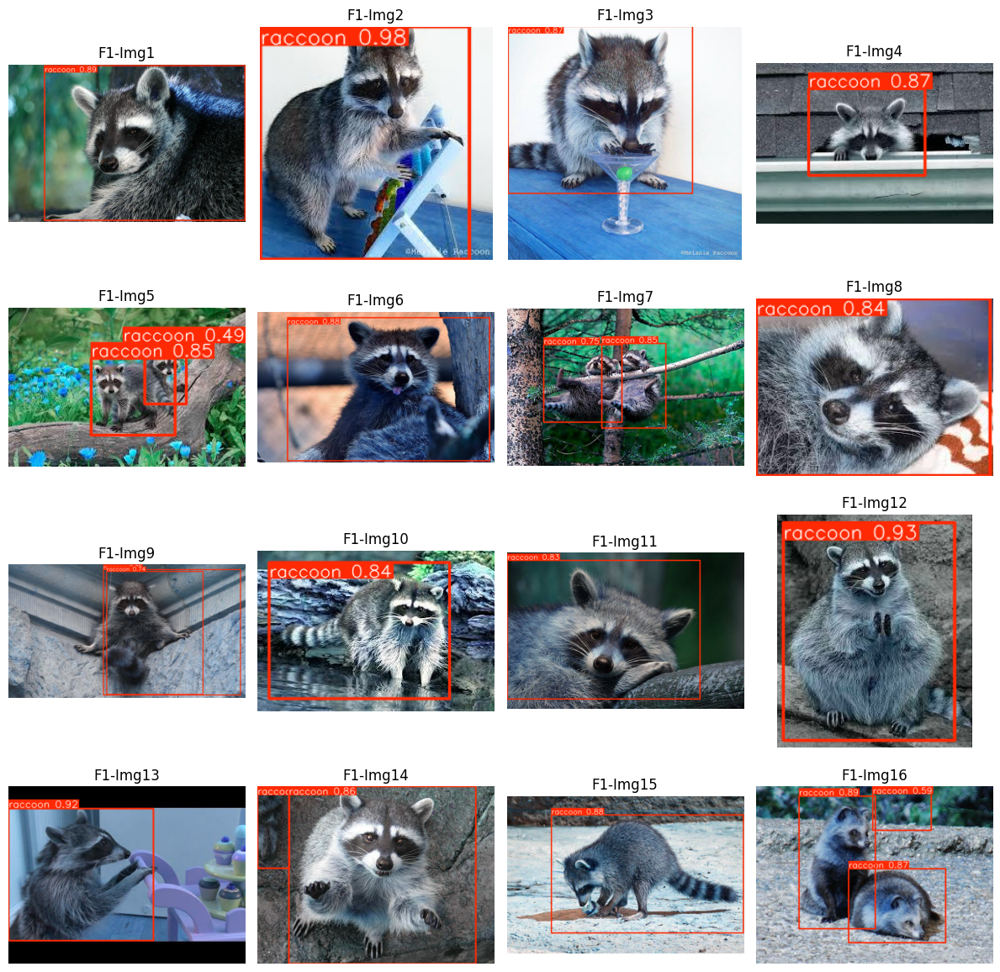


image 1/17 /content/test/images/raccoon-57_jpg.rf.9a1351ac4447ff21d4390fd8e323e7bf.jpg: 448x640 1 raccoon, 13.6ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.d06ce184082977965e0659f0444ed3c9.jpg: 640x640 1 raccoon, 10.8ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.079100ee6a52181388c3677744a5c16a.jpg: 640x640 1 raccoon, 10.0ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.ee59d00b346bda9929f905defbf367ee.jpg: 448x640 1 raccoon, 10.0ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.3b2ab56ca1eccdae9144b40b65e0e23b.jpg: 448x640 1 raccoon, 11.2ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.a055b6e5102faea5fa404472bbc7a5fc.jpg: 416x640 1 raccoon, 9.6ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.ee21dbec555f80345f8537eac0e37c3d.jpg: 448x640 2 raccoons, 8.8ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.47ce5bdc84c74f8c705fd2c74aede4b2.jpg: 480x640 1 raccoon, 8.7ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.10d9d5caae920c4440eb3dafad353391.jpg: 3

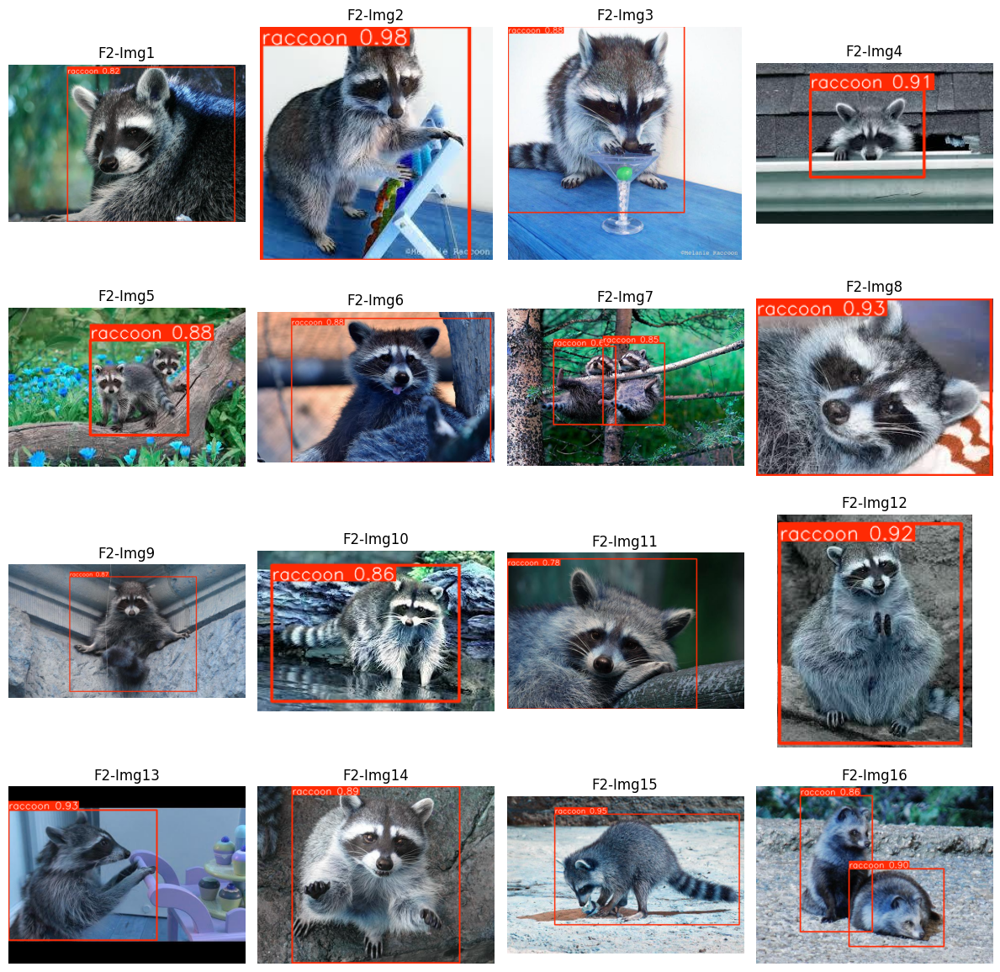


image 1/17 /content/test/images/raccoon-57_jpg.rf.9a1351ac4447ff21d4390fd8e323e7bf.jpg: 448x640 2 raccoons, 7.9ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.d06ce184082977965e0659f0444ed3c9.jpg: 640x640 1 raccoon, 9.6ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.079100ee6a52181388c3677744a5c16a.jpg: 640x640 1 raccoon, 8.6ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.ee59d00b346bda9929f905defbf367ee.jpg: 448x640 1 raccoon, 9.1ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.3b2ab56ca1eccdae9144b40b65e0e23b.jpg: 448x640 2 raccoons, 8.8ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.a055b6e5102faea5fa404472bbc7a5fc.jpg: 416x640 1 raccoon, 8.2ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.ee21dbec555f80345f8537eac0e37c3d.jpg: 448x640 2 raccoons, 7.8ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.47ce5bdc84c74f8c705fd2c74aede4b2.jpg: 480x640 1 raccoon, 7.6ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.10d9d5caae920c4440eb3dafad353391.jpg: 384x

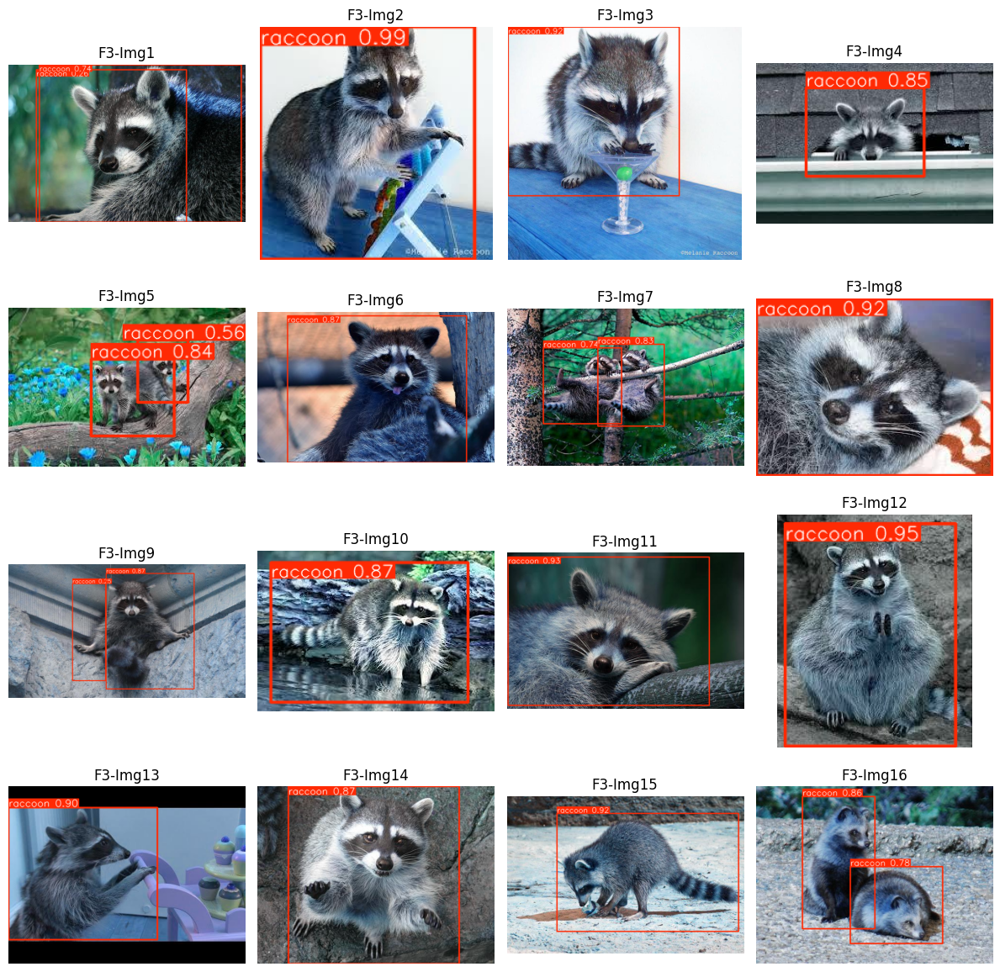


image 1/17 /content/test/images/raccoon-57_jpg.rf.9a1351ac4447ff21d4390fd8e323e7bf.jpg: 448x640 1 raccoon, 14.4ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.d06ce184082977965e0659f0444ed3c9.jpg: 640x640 1 raccoon, 17.2ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.079100ee6a52181388c3677744a5c16a.jpg: 640x640 1 raccoon, 16.2ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.ee59d00b346bda9929f905defbf367ee.jpg: 448x640 1 raccoon, 13.6ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.3b2ab56ca1eccdae9144b40b65e0e23b.jpg: 448x640 2 raccoons, 12.7ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.a055b6e5102faea5fa404472bbc7a5fc.jpg: 416x640 3 raccoons, 13.6ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.ee21dbec555f80345f8537eac0e37c3d.jpg: 448x640 4 raccoons, 13.6ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.47ce5bdc84c74f8c705fd2c74aede4b2.jpg: 480x640 1 raccoon, 13.7ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.10d9d5caae920c4440eb3dafad353391.j

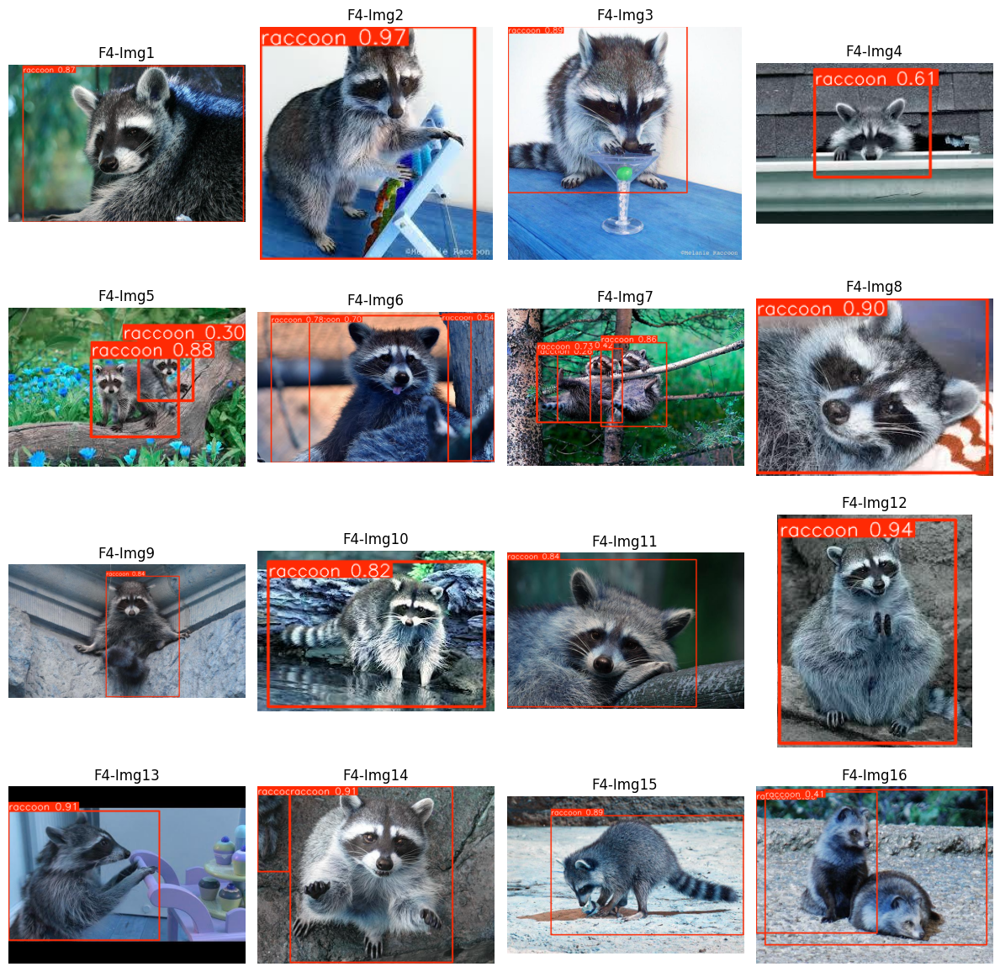


image 1/17 /content/test/images/raccoon-57_jpg.rf.9a1351ac4447ff21d4390fd8e323e7bf.jpg: 448x640 1 raccoon, 17.4ms
image 2/17 /content/test/images/raccoon-58_jpg.rf.d06ce184082977965e0659f0444ed3c9.jpg: 640x640 1 raccoon, 19.7ms
image 3/17 /content/test/images/raccoon-59_jpg.rf.079100ee6a52181388c3677744a5c16a.jpg: 640x640 1 raccoon, 16.3ms
image 4/17 /content/test/images/raccoon-60_jpg.rf.ee59d00b346bda9929f905defbf367ee.jpg: 448x640 1 raccoon, 17.0ms
image 5/17 /content/test/images/raccoon-61_jpg.rf.3b2ab56ca1eccdae9144b40b65e0e23b.jpg: 448x640 2 raccoons, 12.7ms
image 6/17 /content/test/images/raccoon-62_jpg.rf.a055b6e5102faea5fa404472bbc7a5fc.jpg: 416x640 1 raccoon, 12.7ms
image 7/17 /content/test/images/raccoon-63_jpg.rf.ee21dbec555f80345f8537eac0e37c3d.jpg: 448x640 1 raccoon, 12.0ms
image 8/17 /content/test/images/raccoon-64_jpg.rf.47ce5bdc84c74f8c705fd2c74aede4b2.jpg: 480x640 1 raccoon, 12.2ms
image 9/17 /content/test/images/raccoon-66_jpg.rf.10d9d5caae920c4440eb3dafad353391.jpg

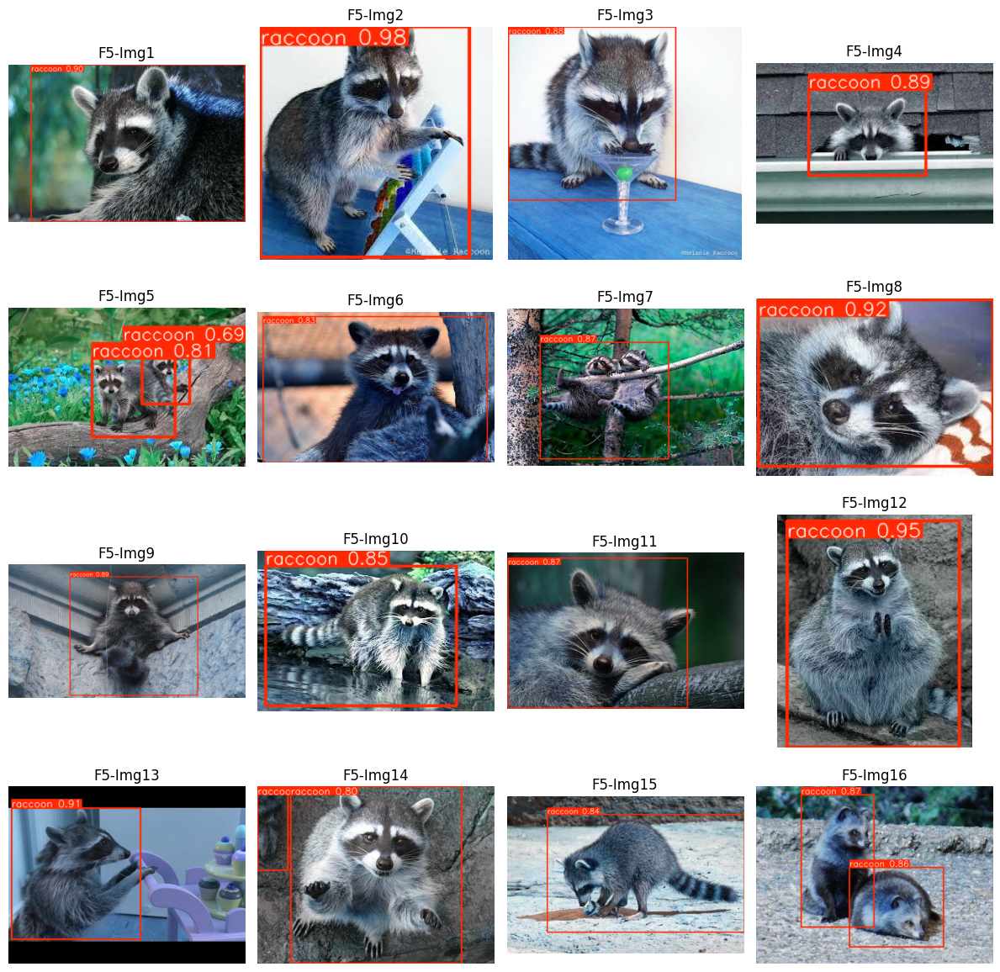

In [27]:
import matplotlib.pyplot as plt
from ultralytics import YOLO

weights = [
    "/content/kfold_demo/fold_1/weights/best.pt",
    "/content/kfold_demo/fold_2/weights/best.pt",
    "/content/kfold_demo/fold_3/weights/best.pt",
    "/content/kfold_demo/fold_4/weights/best.pt",
    "/content/kfold_demo/fold_5/weights/best.pt",
]

test_dir = "/content/test/images"

for fi, w in enumerate(weights, start=1):
    model = YOLO(w)
    results = model.predict(source=test_dir)

    count = min(16, len(results))
    plt.figure(figsize=(12, 12))

    for i, res in enumerate(results[:count]):
        img = res.plot()
        ax = plt.subplot(4, 4, i + 1)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"F{fi}-Img{i+1}")

    plt.tight_layout()
    plt.show()

참고자료: https://docs.ultralytics.com/ko/guides/kfold-cross-validation/#k-fold-dataset-split